In [1]:
import pandas as pd
from datetime import date
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import MinMaxScaler
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout,LSTM,Activation,RepeatVector
from feature_engine.timeseries.forecasting import LagFeatures, WindowFeatures, ExpandingWindowFeatures
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import grangercausalitytests, adfuller
from tqdm import tqdm_notebook
from itertools import product

import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd
import numpy as np

In [8]:
df = pd.read_csv('m-hsmort7112.txt', sep=' ')

In [9]:
df.head()

,year,mon,hs,mort
0,1971,4,1986,7.31
1,1971,5,2049,7.43
2,1971,6,2026,7.53
3,1971,7,2083,7.60
4,1971,8,2158,7.70


In [10]:
df['Date'] = df['year'].astype(str)+' /'+df['mon'].astype(str)

In [11]:
df_new = df[['Date', 'hs','mort']]
df_new

,Date,hs,mort
0,1971 /4,1986,7.31
1,1971 /5,2049,7.43
2,1971 /6,2026,7.53
3,1971 /7,2083,7.60
4,1971 /8,2158,7.70
...,...,...,...
487,2011 /11,702,3.99
488,2011 /12,681,3.96
489,2012 /1,714,3.92
490,2012 /2,694,3.89


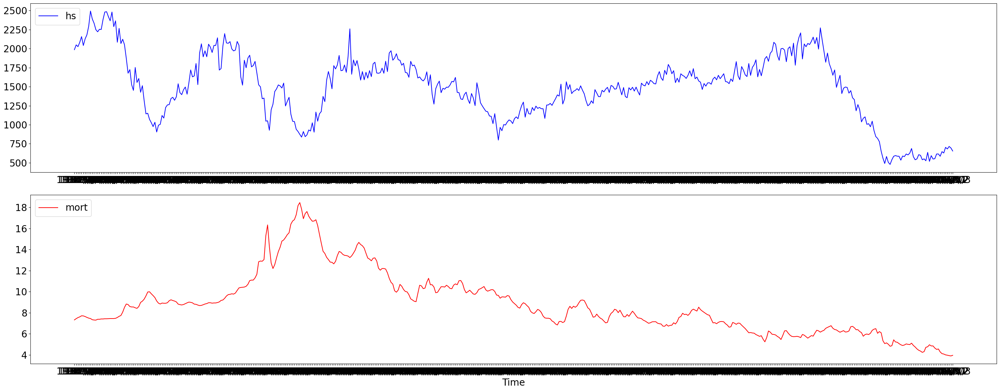

In [12]:
plt.figure(figsize=(30,12))
plt.rcParams["font.size"]="20"
plt.subplot(2,1,1)
plt.plot(df_new['Date'],df_new['hs'],label='hs',color='b')
plt.legend(loc='upper left')

plt.subplot(2,1,2)
plt.plot(df_new['Date'],df_new['mort'],label='mort',color='r')
plt.legend(loc='upper left')

plt.xlabel('Time')
plt.tight_layout()
plt.show()

In [13]:
df_new['Date'] = pd.to_datetime(df_new['Date'])
df_new['Date']

C:\Users\User\AppData\Local\Temp\ipykernel_2696\35616042.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['Date'] = pd.to_datetime(df_new['Date'])


0     1971-04-01
1     1971-05-01
2     1971-06-01
3     1971-07-01
4     1971-08-01
         ...    
487   2011-11-01
488   2011-12-01
489   2012-01-01
490   2012-02-01
491   2012-03-01
Name: Date, Length: 492, dtype: datetime64[ns]

In [14]:
df_ = df_new.copy()
df_

,Date,hs,mort
0,1971-04-01,1986,7.31
1,1971-05-01,2049,7.43
2,1971-06-01,2026,7.53
3,1971-07-01,2083,7.60
4,1971-08-01,2158,7.70
...,...,...,...
487,2011-11-01,702,3.99
488,2011-12-01,681,3.96
489,2012-01-01,714,3.92
490,2012-02-01,694,3.89


In [15]:
#Date Time Features
df_['year']  = df_['Date'].dt.year
df_['month']  = df_['Date'].dt.month

In [16]:
#Lag features
df_[f"hs_lag_1"] = df_["hs"].shift(periods=1)
df_[f"hs_lag_2"] = df_["hs"].shift(periods=2)
df_[f"hs_lag_3"] = df_["hs"].shift(periods=3)
df_[f"hs_lag_4"] = df_["hs"].shift(periods=4)
df_[f"hs_lag_5"] = df_["hs"].shift(periods=5)
df_[f"hs_lag_6"] = df_["hs"].shift(periods=6)
df_[f"hs_lag_7"] = df_["hs"].shift(periods=7)
df_[f"hs_lag_8"] = df_["hs"].shift(periods=8)
df_[f"hs_lag_12"] = df_["hs"].shift(periods=12)
df_[f"hs_lag_14"] = df_["hs"].shift(periods=14)
df_[f"hs_lag_16"] = df_["hs"].shift(periods=16)
df_[f"hs_lag_18"] = df_["hs"].shift(periods=18)
df_[f"hs_lag_20"] = df_["hs"].shift(periods=20)
df_[f"hs_lag_22"] = df_["hs"].shift(periods=22)
df_[f"hs_lag_24"] = df_["hs"].shift(periods=24)
df_[f"hs_lag_28"] = df_["hs"].shift(periods=28)
df_[f"hs_lag_30"] = df_["hs"].shift(periods=30)


In [17]:
#Lag features
df_[f"mort_lag_1"] = df_["mort"].shift(periods=1)
df_[f"mort_lag_2"] = df_["mort"].shift(periods=2)
df_[f"mort_lag_3"] = df_["mort"].shift(periods=3)
df_[f"mort_lag_4"] = df_["mort"].shift(periods=4)
df_[f"mort_lag_5"] = df_["mort"].shift(periods=5)
df_[f"mort_lag_6"] = df_["mort"].shift(periods=6)
df_[f"mort_lag_7"] = df_["mort"].shift(periods=7)
df_[f"mort_lag_8"] = df_["mort"].shift(periods=8)
df_[f"mort_lag_12"] = df_["mort"].shift(periods=12)
df_[f"mort_lag_14"] = df_["mort"].shift(periods=14)
df_[f"mort_lag_16"] = df_["mort"].shift(periods=16)
df_[f"mort_lag_18"] = df_["mort"].shift(periods=18)
df_[f"mort_lag_20"] = df_["mort"].shift(periods=20)
df_[f"mort_lag_22"] = df_["mort"].shift(periods=22)
df_[f"mort_lag_24"] = df_["mort"].shift(periods=24)
df_[f"mort_lag_28"] = df_["mort"].shift(periods=28)
df_[f"mort_lag_30"] = df_["mort"].shift(periods=30)


In [18]:
#Rolling window feature
df_['rolling_mean_hs_7'] = df_['hs'].rolling(window=7).mean()
df_['rolling_mean_hs_12'] = df_['hs'].rolling(window=12).mean()
df_['rolling_mean_hs_16'] = df_['hs'].rolling(window=16).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=20).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=24).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=28).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=32).mean()
df_['rolling_mean_hs_40'] = df_['hs'].rolling(window=40).mean()
df_['rolling_mean_hs_80'] = df_['hs'].rolling(window=80).mean()
df_['rolling_mean_hs_100'] = df_['hs'].rolling(window=100).mean()
df_['rolling_mean_hs_200'] = df_['hs'].rolling(window=200).mean()

In [19]:
df_['rolling_mean_mort_7'] = df_['mort'].rolling(window=7).mean()
df_['rolling_mean_mort_12'] = df_['mort'].rolling(window=12).mean()
df_['rolling_mean_mort_16'] = df_['mort'].rolling(window=16).mean()
df_['rolling_mean_mort_20'] = df_['mort'].rolling(window=20).mean()
df_['rolling_mean_mort_24'] = df_['mort'].rolling(window=24).mean()
df_['rolling_mean_mort_24'] = df_['mort'].rolling(window=28).mean()
df_['rolling_mean_mort_24'] = df_['mort'].rolling(window=32).mean()
df_['rolling_mean_mort_40'] = df_['mort'].rolling(window=40).mean()
df_['rolling_mean_mort_80'] = df_['mort'].rolling(window=80).mean()
df_['rolling_mean_mort_100'] = df_['mort'].rolling(window=100).mean()
df_['rolling_mean_mort_200'] = df_['mort'].rolling(window=200).mean()

In [20]:
#Expanding Window feature
df_['expanding_mean_mort_7'] = df_['mort'].expanding(7).mean()
df_['expanding_mean_mort_12'] = df_['mort'].expanding(12).mean()
df_['expanding_mean_mort_16'] = df_['mort'].expanding(16).mean()
df_['expanding_mean_mort_20'] = df_['mort'].expanding(20).mean()
df_['expanding_mean_mort_24'] = df_['mort'].expanding(24).mean()
df_['expanding_mean_mort_28'] = df_['mort'].expanding(28).mean()
df_['expanding_mean_mort_40'] = df_['mort'].expanding(40).mean()
df_['expanding_mean_mort_80'] = df_['mort'].expanding(80).mean()
df_['expanding_mean_mort_100'] = df_['mort'].expanding(100).mean()
df_['expanding_mean_mort_200'] = df_['mort'].expanding(200).mean()

In [21]:
#Expanding Window feature
df_['expanding_mean_hs_7'] = df_['hs'].expanding(7).mean()
df_['expanding_mean_hs_12'] = df_['hs'].expanding(12).mean()
df_['expanding_mean_hs_16'] = df_['hs'].expanding(16).mean()
df_['expanding_mean_hs_20'] = df_['hs'].expanding(20).mean()
df_['expanding_mean_hs_24'] = df_['hs'].expanding(24).mean()
df_['expanding_mean_hs_28'] = df_['hs'].expanding(28).mean()
df_['expanding_mean_hs_40'] = df_['hs'].expanding(40).mean()
df_['expanding_mean_hs_80'] = df_['hs'].expanding(80).mean()
df_['expanding_mean_hs_100'] = df_['hs'].expanding(100).mean()
df_['expanding_mean_hs_200'] = df_['hs'].expanding(200).mean()

In [16]:
#Remove seasonality using differencing
#df_['hsold_diff_1'] = df_['hsold'] - df_["hsold"].shift(periods=1)
#df_['hsold_diff_2'] = df_['hsold'] - df_["hsold"].shift(periods=2)
#df_['hsold_diff_3'] = df_['hsold'] - df_["hsold"].shift(periods=3)
#df_['hsold_diff_4'] = df_['hsold'] - df_["hsold"].shift(periods=4)
#df_['hsold_diff_7'] = df_['hsold'] - df_["hsold"].shift(periods=7)
#df_['hsold_diff_12'] = df_['hsold'] - df_["hsold"].shift(periods=12)


#df_['hstart_diff_1'] = df_['hstart'] - df_["hstart"].shift(periods=1)
#df_['hstart_diff_2'] = df_['hstart'] - df_["hstart"].shift(periods=2)
#df_['hstart_diff_3'] = df_['hstart'] - df_["hstart"].shift(periods=3)
#df_['hstart_diff_4'] = df_['hstart'] - df_["hstart"].shift(periods=4)
#df_['hstart_diff_7'] = df_['hstart'] - df_["hstart"].shift(periods=7)
#df_['hstart_diff_12'] = df_['hstart'] - df_["hstart"].shift(periods=12)



In [22]:
df_

,Date,hs,mort,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,1971-04-01,1986,7.31,1971,4,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1971-05-01,2049,7.43,1971,5,1986.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1971-06-01,2026,7.53,1971,6,2049.0,1986.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1971-07-01,2083,7.60,1971,7,2026.0,2049.0,1986.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1971-08-01,2158,7.70,1971,8,2083.0,2026.0,2049.0,1986.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
487,2011-11-01,702,3.99,2011,11,628.0,646.0,585.0,615.0,615.0,...,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885
488,2011-12-01,681,3.96,2011,12,702.0,628.0,646.0,585.0,615.0,...,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076
489,2012-01-01,714,3.92,2012,1,681.0,702.0,628.0,646.0,585.0,...,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429
490,2012-02-01,694,3.89,2012,2,714.0,681.0,702.0,628.0,646.0,...,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548


In [23]:
df = df_.fillna(0)

# Random Forest

In [24]:
#Splitting data into x,y
y =df["hs"]
X =df.drop(["Date","hs","mort"],axis=1)

In [25]:
X

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
487,2011,11,628.0,646.0,585.0,615.0,615.0,553.0,549.0,593.0,...,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885,1497.536885
488,2011,12,702.0,628.0,646.0,585.0,615.0,615.0,553.0,549.0,...,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076,1495.867076
489,2012,1,681.0,702.0,628.0,646.0,585.0,615.0,615.0,553.0,...,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429,1494.271429
490,2012,2,714.0,681.0,702.0,628.0,646.0,585.0,615.0,615.0,...,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548,1492.641548


In [26]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]

In [27]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]

In [28]:
train_data_x

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,2003,8,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,...,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961
389,2003,9,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,...,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385
390,2003,10,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,...,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404
391,2003,11,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,...,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000


In [29]:
model_rf = RandomForestClassifier()

In [30]:
#fit the model
model_rf.fit(train_data_x,train_data_y)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.0


In [71]:
model_rf.feature_importances_

array([0.02148364, 0.02389847, 0.02023764, 0.01778035, 0.01843993,
       0.01671412, 0.01745422, 0.01990724, 0.0180614 , 0.01805049,
       0.01928584, 0.01677699, 0.01583592, 0.0151885 , 0.01759239,
       0.01677056, 0.01601474, 0.02037819, 0.01764334, 0.01689631,
       0.01705378, 0.01830351, 0.01648824, 0.01943651, 0.01886377,
       0.01993837, 0.01819779, 0.01771656, 0.0172378 , 0.01717518,
       0.01886247, 0.0190179 , 0.01721583, 0.01679511, 0.01703853,
       0.0162183 , 0.01599364, 0.01442139, 0.01514402, 0.01431147,
       0.01205945, 0.01213659, 0.01379816, 0.01418194, 0.01304736,
       0.01486711, 0.01263645, 0.01297826, 0.01218838, 0.01169438,
       0.01162639, 0.01020871, 0.01556895, 0.01507763, 0.01621865,
       0.01306146, 0.01346364, 0.01407327, 0.01342245, 0.01421781,
       0.01222434, 0.01140814])

In [72]:
model_rf.feature_names_in_


array(['hs_lag_1', 'hs_lag_2', 'hs_lag_3', 'hs_lag_4', 'hs_lag_5',
       'hs_lag_6', 'hs_lag_7', 'hs_lag_8', 'hs_lag_12', 'hs_lag_14',
       'hs_lag_16', 'hs_lag_18', 'hs_lag_20', 'hs_lag_22', 'hs_lag_24',
       'hs_lag_28', 'hs_lag_30', 'mort_lag_1', 'mort_lag_2', 'mort_lag_3',
       'mort_lag_4', 'mort_lag_5', 'mort_lag_6', 'mort_lag_7',
       'mort_lag_8', 'mort_lag_12', 'mort_lag_14', 'mort_lag_16',
       'mort_lag_18', 'mort_lag_20', 'mort_lag_22', 'mort_lag_24',
       'mort_lag_28', 'mort_lag_30', 'rolling_mean_hs_7',
       'rolling_mean_hs_12', 'rolling_mean_hs_16', 'rolling_mean_hs_20',
       'rolling_mean_hs_40', 'rolling_mean_hs_80', 'rolling_mean_hs_100',
       'rolling_mean_hs_200', 'expanding_mean_mort_7',
       'expanding_mean_mort_12', 'expanding_mean_mort_16',
       'expanding_mean_mort_20', 'expanding_mean_mort_24',
       'expanding_mean_mort_28', 'expanding_mean_mort_40',
       'expanding_mean_mort_80', 'expanding_mean_mort_100',
       'expanding_mean_m

<BarContainer object of 62 artists>

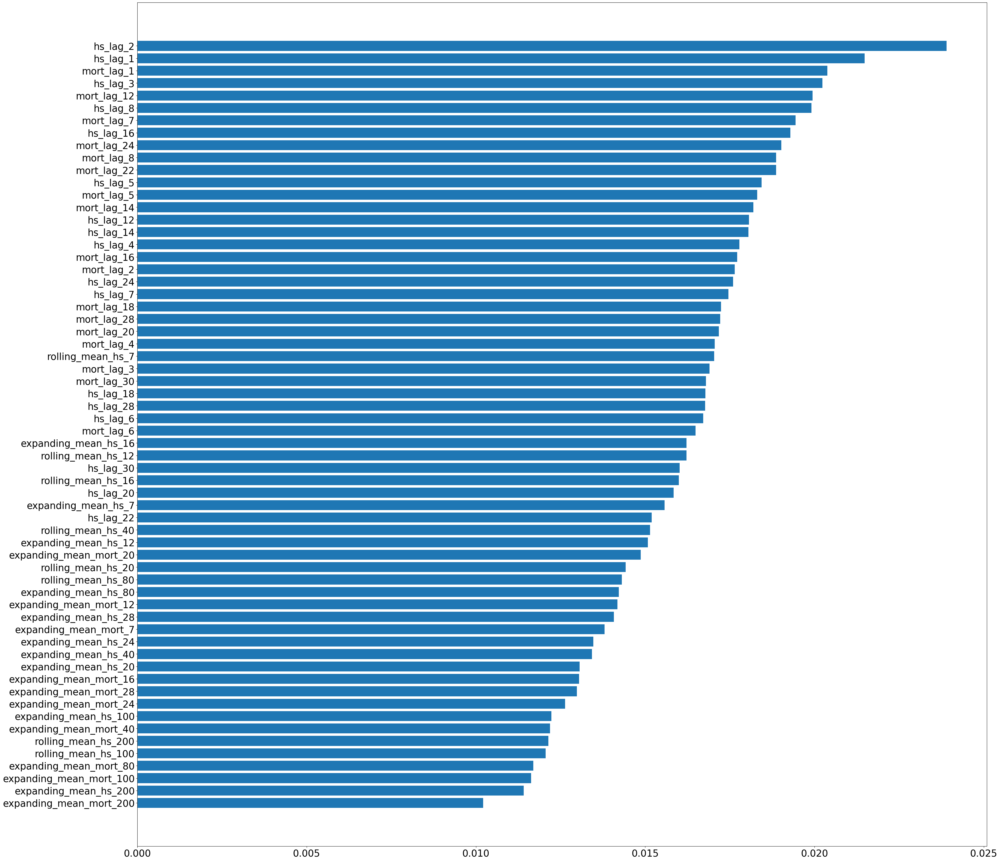

In [73]:
importances_df = pd.DataFrame({"feature_names" : model_rf.feature_names_in_, 
                               "importances" : model_rf.feature_importances_})

importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])
#g.set_title("Feature importances", fontsize=25);                          


# RandomForest hstart data

In [74]:
#Splitting data into x,y
y_mort = df["mort"].astype(int)

X_mort =df.drop(["Date","hs","mort"],axis=1)

In [75]:
train_size = int(len(X_mort)*0.8)
test_size_x = len(X_mort) - train_size
train_data_x_mort = X_mort[:train_size]
test_data_x_mort =  X_mort[train_size:]

In [76]:
train_size = int(len(y_mort)*0.8)
test_size_y = len(y_mort) - train_size
train_data_y_mort = y_mort[:train_size]
test_data_y_mort =  y_mort[train_size:]
train_data_y_mort

0      7
1      7
2      7
3      7
4      7
      ..
388    6
389    6
390    5
391    5
392    5
Name: mort, Length: 393, dtype: int32

In [77]:
model_rf_mort = RandomForestClassifier()


In [78]:
model_rf_mort.fit(train_data_x_mort,train_data_y_mort)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x_mort)
accuracy =accuracy_score(test_data_y_mort,y_pred)
print(accuracy)


0.0


<BarContainer object of 62 artists>

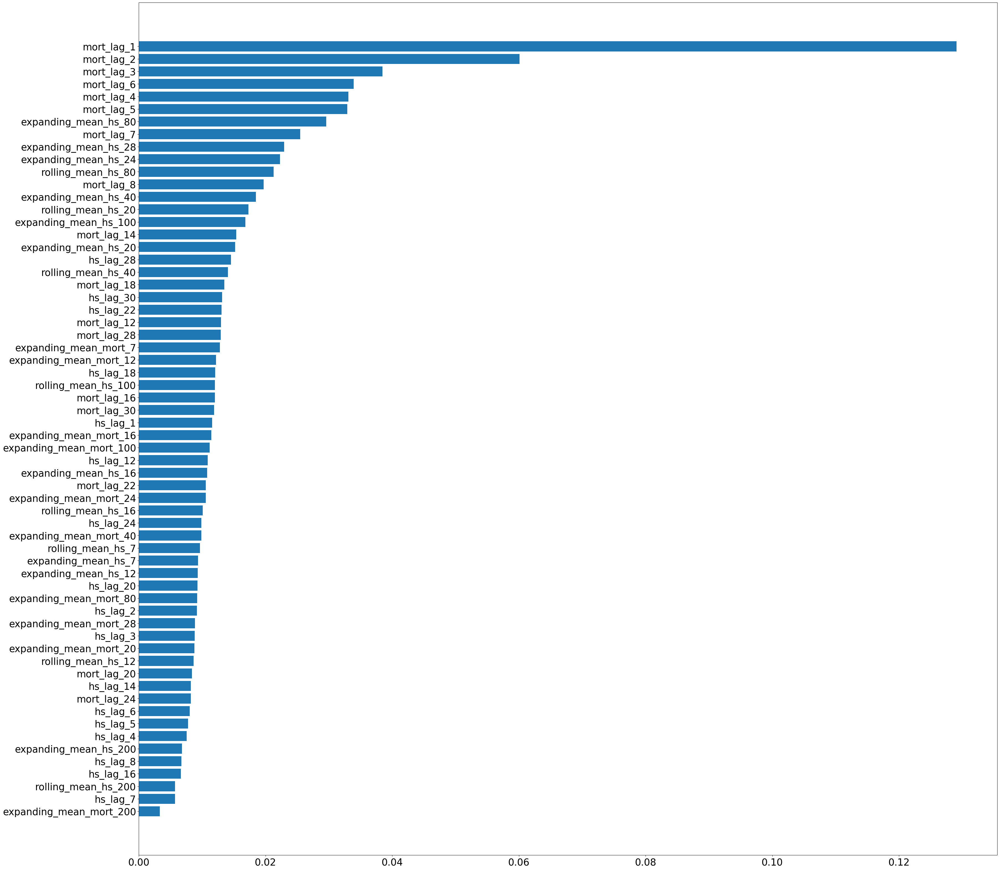

In [79]:
importances_df = pd.DataFrame({"feature_names" : model_rf_mort.feature_names_in_, 
                               "importances" : model_rf_mort.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                  
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

In [43]:
#Correlation
cor = df.corr()
top_corr_features = cor.index
plt.figure(figsize=(100,100))
g = sb.heatmap(df_[top_corr_features].corr(),annot=True,)

C:\Users\User\AppData\Local\Temp\ipykernel_20320\1298823419.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


# XGB classifier

In [80]:
#Splitting data into x,y
y =df["hs"]
X =df.drop(["Date","hs","mort"],axis=1)

In [81]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,hs_lag_12,hs_lag_14,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,1633.0,1717.0,...,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961
389,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1804.0,1655.0,...,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385
390,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1648.0,1633.0,...,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404
391,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1753.0,1804.0,...,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000


In [82]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      1986
1      2049
2      2026
3      2083
4      2158
       ... 
388    1833
389    1939
390    1967
391    2083
392    2057
Name: hs, Length: 393, dtype: int64

In [83]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y = le.fit_transform(train_data_y)
test_data_y = le.fit_transform(test_data_y)
train_data_y.shape

(393,)

In [84]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x,train_data_y)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [85]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.0


<BarContainer object of 62 artists>

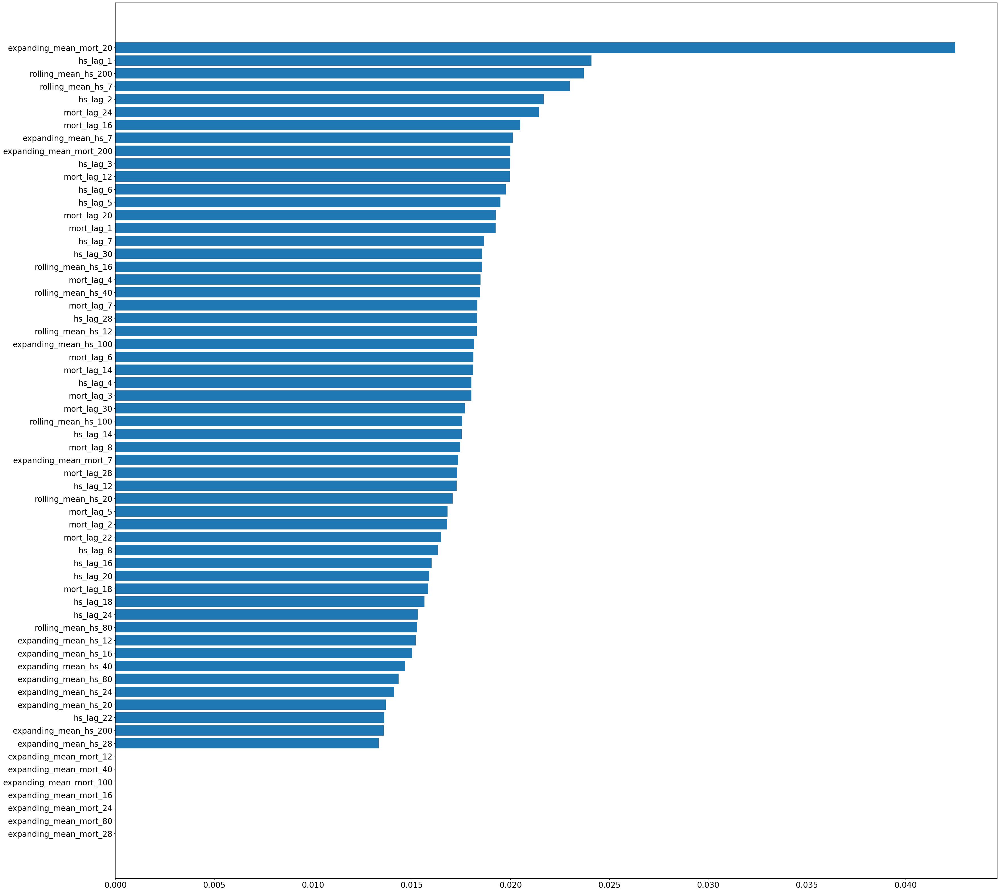

In [86]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   
                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# XGB For hstart

In [87]:
#Splitting data into x,y
y =df["mort"]
X =df.drop(["Date","hs","mort"],axis=1)

In [88]:
train_size = int(len(X)*0.8)
test_size = len(X) - train_size
train_data_x_mort = X[:train_size]
test_data_x_mort =  X[train_size:]
train_data_x_mort

,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,hs_lag_12,hs_lag_14,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,1633.0,1717.0,...,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961
389,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1804.0,1655.0,...,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385
390,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1648.0,1633.0,...,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404
391,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1753.0,1804.0,...,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000


In [89]:
train_size = int(len(y)*0.8)
test_size = len(y) - train_size
train_data_y_mort = y[:train_size]
test_data_y_mort =  y[train_size:]
train_data_y_mort

0      7.31
1      7.43
2      7.53
3      7.60
4      7.70
       ... 
388    6.26
389    6.15
390    5.95
391    5.93
392    5.88
Name: mort, Length: 393, dtype: float64

In [90]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y_mort = le.fit_transform(train_data_y_mort)
train_data_y_mort.shape
test_data_y_mort = le.fit_transform(test_data_y_mort)

In [91]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x_mort,train_data_y_mort)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [92]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x_mort)
accuracy =accuracy_score(test_data_y_mort,y_pred)
print(accuracy)

0.010101010101010102


<BarContainer object of 62 artists>

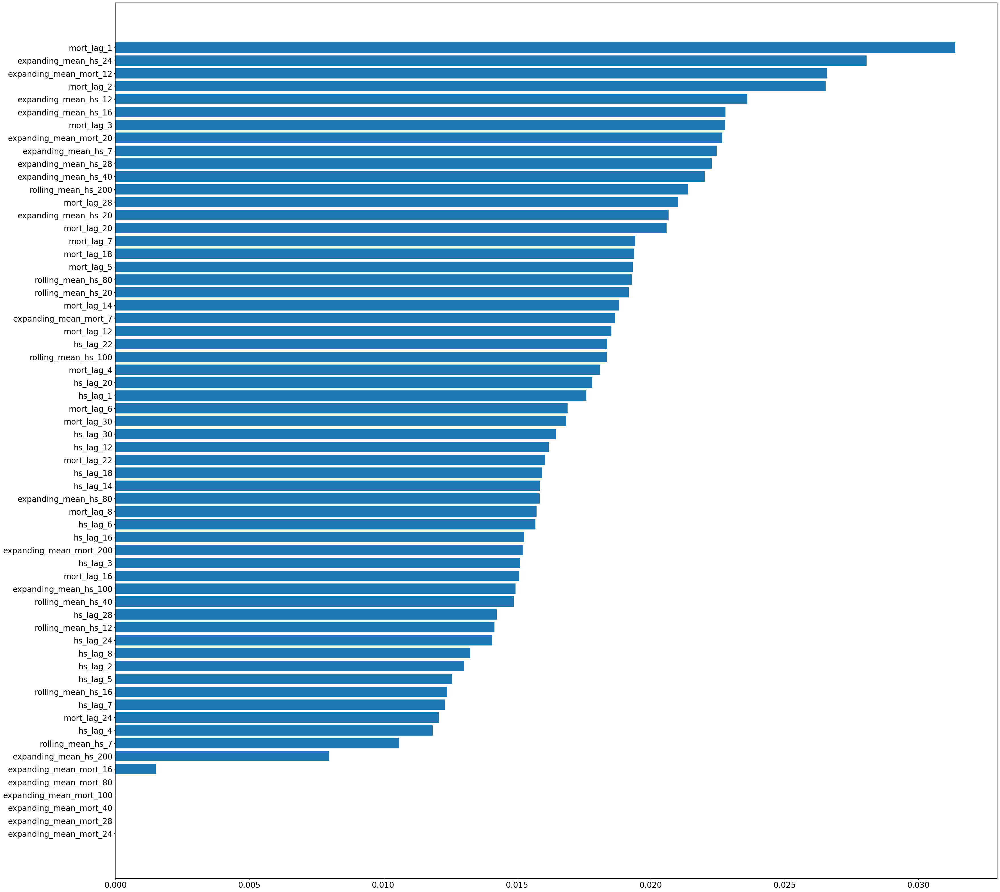

In [93]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   

# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree classifier

In [94]:
#Splitting data into x,y
y =df["hs"]
X =df.drop(["Date","hs","mort"],axis=1)

In [95]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,hs_lag_12,hs_lag_14,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,1633.0,1717.0,...,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961
389,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1804.0,1655.0,...,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385
390,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1648.0,1633.0,...,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404
391,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1753.0,1804.0,...,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000


In [96]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      1986
1      2049
2      2026
3      2083
4      2158
       ... 
388    1833
389    1939
390    1967
391    2083
392    2057
Name: hs, Length: 393, dtype: int64

In [97]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x,train_data_y)

DecisionTreeClassifier()

In [99]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.0


<BarContainer object of 62 artists>

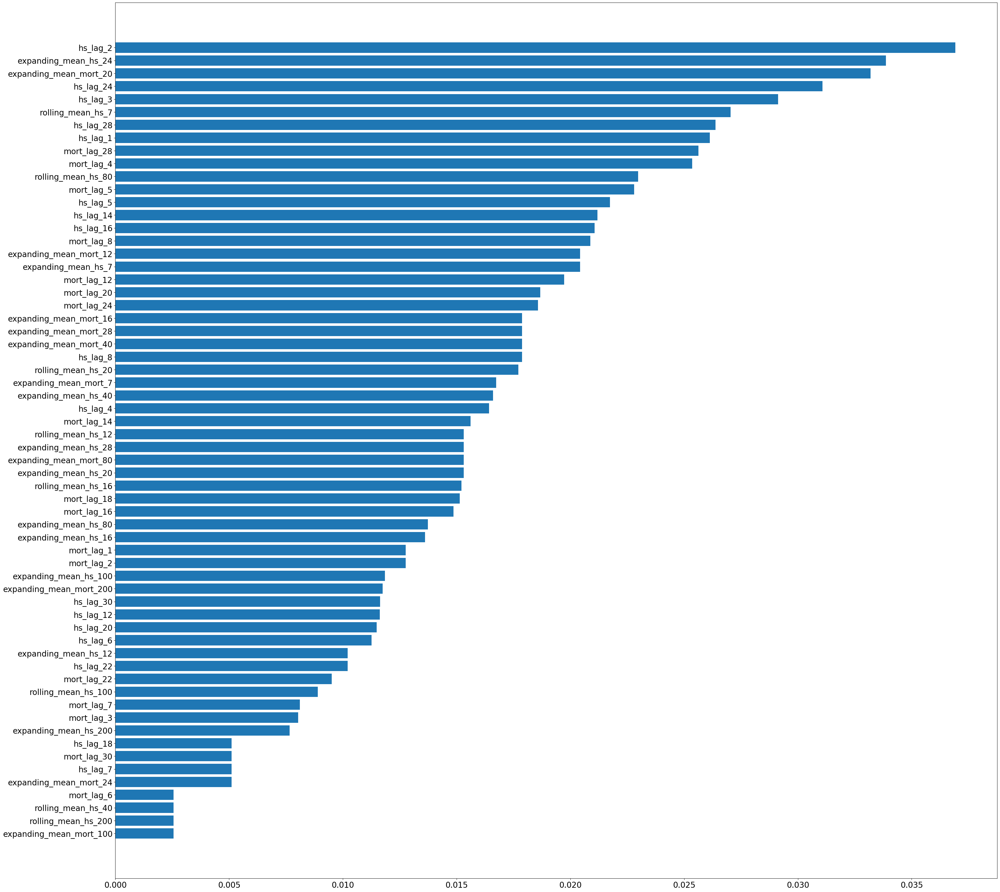

In [100]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)              
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree hstart

In [101]:
#Splitting data into x,y
y =df["mort"].astype(int)
X =df.drop(["Date","hs","mort"],axis=1)

In [102]:
train_size = int(len(X)*0.8)
test_size = len(X) - train_size
train_data_x_mort = X[:train_size]
test_data_x_mort =  X[train_size:]
train_data_x_mort

,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,hs_lag_12,hs_lag_14,...,expanding_mean_hs_7,expanding_mean_hs_12,expanding_mean_hs_16,expanding_mean_hs_20,expanding_mean_hs_24,expanding_mean_hs_28,expanding_mean_hs_40,expanding_mean_hs_80,expanding_mean_hs_100,expanding_mean_hs_200
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,1633.0,1717.0,...,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961,1556.634961
389,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1804.0,1655.0,...,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385,1557.615385
390,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1648.0,1633.0,...,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404,1558.662404
391,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1753.0,1804.0,...,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000


In [103]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y_mort = y[:train_size]
test_data_y_mort =  y[train_size:]
train_data_y_mort

0      7
1      7
2      7
3      7
4      7
      ..
388    6
389    6
390    5
391    5
392    5
Name: mort, Length: 393, dtype: int32

In [104]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x_mort,train_data_y_mort)

DecisionTreeClassifier()

In [105]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x_mort)
accuracy =accuracy_score(test_data_y_mort,y_pred)
print(accuracy)

0.40404040404040403


<BarContainer object of 62 artists>

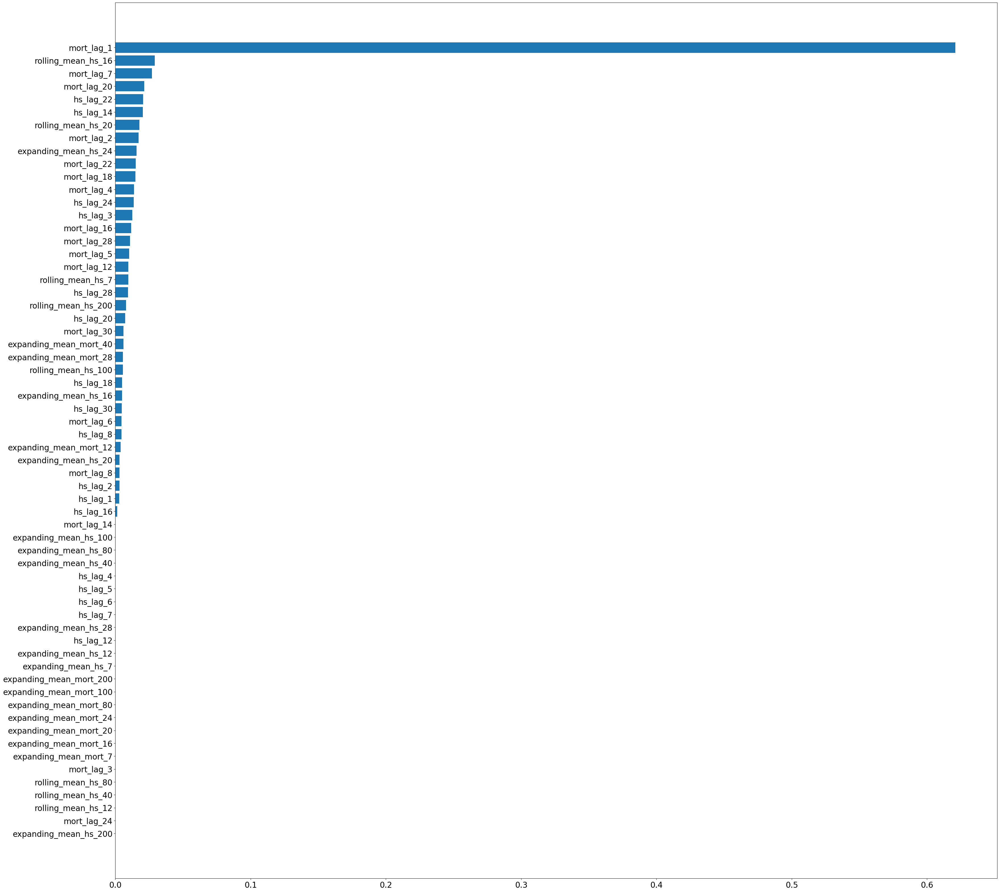

In [106]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# VAR 3 top features

In [31]:
#Data set for 
data_set_1 = df[['hs','hs_lag_1','mort_lag_12','hs_lag_2']]
data_set_1

,hs,hs_lag_1,mort_lag_12,hs_lag_2
0,1986,0.0,0.00,0.0
1,2049,1986.0,0.00,0.0
2,2026,2049.0,0.00,1986.0
3,2083,2026.0,0.00,2049.0
4,2158,2083.0,0.00,2026.0
...,...,...,...,...
487,702,628.0,4.30,646.0
488,681,702.0,4.71,628.0
489,714,681.0,4.76,702.0
490,694,714.0,4.95,681.0


In [32]:
for i in range(len(data_set_1.columns)):
    result = adfuller(data_set_1[data_set_1.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_1.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_1.columns[i]))

hs -Series is Stationary
hs_lag_1 -Series is Stationary
mort_lag_12 -Series is not Stationary
hs_lag_2 -Series is Stationary


In [33]:
data_set_1['mort_lag_12']=data_set_1['mort_lag_12'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_2696\1879184688.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_1['mort_lag_12']=data_set_1['mort_lag_12'].diff()[1:]


In [34]:
data_set_1

,hs,hs_lag_1,mort_lag_12,hs_lag_2
0,1986,0.0,NaN,0.0
1,2049,1986.0,0.00,0.0
2,2026,2049.0,0.00,1986.0
3,2083,2026.0,0.00,2049.0
4,2158,2083.0,0.00,2026.0
...,...,...,...,...
487,702,628.0,0.07,646.0
488,681,702.0,0.41,628.0
489,714,681.0,0.05,702.0
490,694,714.0,0.19,681.0


In [35]:
data_set_1 = data_set_1.fillna(0)
data_set_1

,hs,hs_lag_1,mort_lag_12,hs_lag_2
0,1986,0.0,0.00,0.0
1,2049,1986.0,0.00,0.0
2,2026,2049.0,0.00,1986.0
3,2083,2026.0,0.00,2049.0
4,2158,2083.0,0.00,2026.0
...,...,...,...,...
487,702,628.0,0.07,646.0
488,681,702.0,0.41,628.0
489,714,681.0,0.05,702.0
490,694,714.0,0.19,681.0


In [36]:
for i in range(len(data_set_1.columns)):
    result = adfuller(data_set_1[data_set_1.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_1.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_1.columns[i]))

hs -Series is Stationary
hs_lag_1 -Series is Stationary
mort_lag_12 -Series is Stationary
hs_lag_2 -Series is Stationary


In [37]:
max_lags =8
y='hs'

In [38]:
for i in range(len(data_set_1.columns)-1):
    results = grangercausalitytests(data_set_1[[y,data_set_1.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_1.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.6382 , p=0.0000  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=24.7897 , p=0.0000  , df=1
likelihood ratio test: chi2=24.1842 , p=0.0000  , df=1
parameter F test:         F=24.6382 , p=0.0000  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9741  , p=0.3783  , df_denom=486, df_num=2
ssr based chi2 test:   chi2=1.9642  , p=0.3745  , df=2
likelihood ratio test: chi2=1.9602  , p=0.3753  , df=2
parameter F test:         F=25.6023 , p=0.0000  , df_denom=486, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1430  , p=0.9341  , df_denom=484, df_num=3
ssr based chi2 test:   chi2=0.4335  , p=0.9332  , df=3
likelihood ratio test: chi2=0.4333  , p=0.9333  , df=3
parameter F test:         F=17.7723 , p=0.0000  , df_denom=484, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4342  , p=0.2215  

In [39]:
train = data_set_1[:int(0.8*(len(data_set_1)))]
test = data_set_1[int(0.8*(len(data_set_1))):]

In [40]:
test

,hs,hs_lag_1,mort_lag_12,hs_lag_2
393,1911,2057.0,-0.13,2083.0
394,1846,1911.0,-0.08,2057.0
395,1998,1846.0,-0.09,1911.0
396,2003,1998.0,0.06,1846.0
397,1981,2003.0,-0.33,1998.0
...,...,...,...,...
487,702,628.0,0.07,646.0
488,681,702.0,0.41,628.0
489,714,681.0,0.05,702.0
490,694,714.0,0.19,681.0


In [41]:
model = VAR(train.diff()[1:])

In [42]:
#To get the maximum lags =13
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        26.34       26.39   2.758e+11       26.36
1       -112.1      -111.9   2.056e-49      -112.0
2      -114.7*     -114.4*  1.469e-50*     -114.6*
3       -111.8      -111.3   2.797e-49      -111.6
4       -114.3      -113.5   2.383e-50      -114.0
5       -113.0      -112.1   8.685e-50      -112.6
6       -112.0      -110.9   2.401e-49      -111.5
7       -112.3      -111.1   1.616e-49      -111.9
8       -110.1      -108.7   1.498e-48      -109.6
9       -110.0      -108.4   1.710e-48      -109.4
10      -111.5      -109.8   3.827e-49      -110.8
11      -106.3      -104.4   6.661e-47      -105.6
12      -107.7      -105.6   1.780e-47      -106.8
13      -108.6      -106.4   6.577e-48      -107.8
14      -109.7      -107.3   2.361e-48      -108.7
15      -109.1      -106.5   4.222e-48      -108.1
16      -109.9      -107.1   1.

In [43]:
model = VAR(train)
results = model.fit(2)

In [44]:
print(results.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 14, Aug, 2023
Time:                     22:12:17
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                   -104.985
Nobs:                     391.000    HQIC:                  -105.206
Log likelihood:           18412.9    FPE:                1.76491e-46
AIC:                     -105.351    Det(Omega_mle):     1.61135e-46
--------------------------------------------------------------------
Results for equation hs
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 67.512840        27.312561            2.472           0.013
L1.hs                  0.670221         0.048305           13.875           0.000
L1.hs_lag_1            0.127719              NAN           

C:\Users\User\anaconda\lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:1545: RuntimeWarning: invalid value encountered in sqrt
  stderr = np.sqrt(np.diag(self.cov_params()))


In [45]:
lag =results.k_ar

In [46]:
predict = results.forecast(train.values[-lag:],steps =99)

In [47]:
predict.shape


(99, 4)

In [48]:
df_pre = pd.DataFrame(predict, columns =['hs_pre','hs_lag_1_pre','mort_lag_12_pre','hs_lag_2_pre'])

In [49]:
df_pre

,hs_pre,hs_lag_1_pre,mort_lag_12_pre,hs_lag_2_pre
0,2040.904300,2057.000000,0.024958,2083.000000
1,2030.899582,2040.904300,0.057588,2057.000000
2,2012.472775,2030.899582,0.034902,2040.904300
3,1997.553602,2012.472775,0.031524,2030.899582
4,1982.882808,1997.553602,0.032685,2012.472775
...,...,...,...,...
94,1578.198742,1578.860621,0.015990,1579.545806
95,1577.559376,1578.198742,0.015965,1578.860621
96,1576.941757,1577.559376,0.015941,1578.198742
97,1576.345144,1576.941757,0.015917,1577.559376


In [50]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hs=math.sqrt(mean_squared_error(df_pre['hs_pre'],test['hs']))
rmse_hs

705.0051029957895

# 7 features

In [51]:
#Data set 
data_set_2 = df[['hs','hs_lag_1','mort_lag_12','hs_lag_2','expanding_mean_mort_20','expanding_mean_hs_24',
                 'hs_lag_3'
                ]]
data_set_2#,'',''

,hs,hs_lag_1,mort_lag_12,hs_lag_2,expanding_mean_mort_20,expanding_mean_hs_24,hs_lag_3
0,1986,0.0,0.00,0.0,0.000000,0.000000,0.0
1,2049,1986.0,0.00,0.0,0.000000,0.000000,0.0
2,2026,2049.0,0.00,1986.0,0.000000,0.000000,0.0
3,2083,2026.0,0.00,2049.0,0.000000,0.000000,1986.0
4,2158,2083.0,0.00,2026.0,0.000000,0.000000,2049.0
...,...,...,...,...,...,...,...
487,702,628.0,4.30,646.0,8.799570,1497.536885,585.0
488,681,702.0,4.71,628.0,8.789673,1495.867076,646.0
489,714,681.0,4.76,702.0,8.779735,1494.271429,628.0
490,694,714.0,4.95,681.0,8.769776,1492.641548,702.0


In [52]:
for i in range(len(data_set_2.columns)):
    result = adfuller(data_set_2[data_set_2.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_2.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_2.columns[i]))

hs -Series is Stationary
hs_lag_1 -Series is Stationary
mort_lag_12 -Series is not Stationary
hs_lag_2 -Series is Stationary
expanding_mean_mort_20 -Series is Stationary
expanding_mean_hs_24 -Series is Stationary
hs_lag_3 -Series is Stationary


In [53]:
data_set_2['mort_lag_12']=data_set_2['mort_lag_12'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_2696\565346322.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_2['mort_lag_12']=data_set_2['mort_lag_12'].diff()[1:]


In [54]:
data_set_2 = data_set_2.fillna(0)
data_set_2

,hs,hs_lag_1,mort_lag_12,hs_lag_2,expanding_mean_mort_20,expanding_mean_hs_24,hs_lag_3
0,1986,0.0,0.00,0.0,0.000000,0.000000,0.0
1,2049,1986.0,0.00,0.0,0.000000,0.000000,0.0
2,2026,2049.0,0.00,1986.0,0.000000,0.000000,0.0
3,2083,2026.0,0.00,2049.0,0.000000,0.000000,1986.0
4,2158,2083.0,0.00,2026.0,0.000000,0.000000,2049.0
...,...,...,...,...,...,...,...
487,702,628.0,0.07,646.0,8.799570,1497.536885,585.0
488,681,702.0,0.41,628.0,8.789673,1495.867076,646.0
489,714,681.0,0.05,702.0,8.779735,1494.271429,628.0
490,694,714.0,0.19,681.0,8.769776,1492.641548,702.0


In [55]:
for i in range(len(data_set_2.columns)):
    result = adfuller(data_set_2[data_set_2.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_2.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_2.columns[i]))

hs -Series is Stationary
hs_lag_1 -Series is Stationary
mort_lag_12 -Series is Stationary
hs_lag_2 -Series is Stationary
expanding_mean_mort_20 -Series is Stationary
expanding_mean_hs_24 -Series is Stationary
hs_lag_3 -Series is Stationary


In [56]:
for i in range(len(data_set_2.columns)-1):
    results = grangercausalitytests(data_set_2[[y,data_set_2.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_2.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.6382 , p=0.0000  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=24.7897 , p=0.0000  , df=1
likelihood ratio test: chi2=24.1842 , p=0.0000  , df=1
parameter F test:         F=24.6382 , p=0.0000  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9741  , p=0.3783  , df_denom=486, df_num=2
ssr based chi2 test:   chi2=1.9642  , p=0.3745  , df=2
likelihood ratio test: chi2=1.9602  , p=0.3753  , df=2
parameter F test:         F=25.6023 , p=0.0000  , df_denom=486, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1430  , p=0.9341  , df_denom=484, df_num=3
ssr based chi2 test:   chi2=0.4335  , p=0.9332  , df=3
likelihood ratio test: chi2=0.4333  , p=0.9333  , df=3
parameter F test:         F=17.7723 , p=0.0000  , df_denom=484, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4342  , p=0.2215  

In [57]:
train = data_set_2[:int(0.8*(len(data_set_2)))]
test = data_set_2[int(0.8*(len(data_set_2))):]

In [58]:
model = VAR(train.diff()[1:])

In [59]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        37.31       37.38   1.596e+16       37.34
1       -176.1      -175.5   3.207e-77      -175.9
2       -176.2      -175.1   2.871e-77      -175.8
3       -174.0      -172.4   2.630e-76      -173.4
4       -178.3      -176.2   3.705e-78      -177.4
5      -179.8*     -177.2*  7.885e-79*     -178.8*
6       -178.0      -174.8   5.119e-78      -176.7
7       -179.7      -176.0   9.059e-79      -178.2
8       -179.2      -175.0   1.477e-78      -177.6
9       -179.2      -174.4   1.586e-78      -177.3
10      -178.2      -173.0   4.259e-78      -176.1
11      -178.1      -172.4   4.586e-78      -175.8
12      -177.4      -171.1   9.678e-78      -174.9
13      -176.1      -169.3   3.470e-77      -173.4
14      -177.3      -170.0   1.125e-77      -174.4
15      -176.9      -169.1   1.613e-77      -173.8
16      -174.5      -166.2   1.

In [60]:
model = VAR(train)
results = model.fit(5)

In [61]:
print(results.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 14, Aug, 2023
Time:                     22:13:15
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                   -153.295
Nobs:                     388.000    HQIC:                  -154.848
Log likelihood:           26636.5    FPE:                2.03753e-68
AIC:                     -155.868    Det(Omega_mle):     1.09487e-68
--------------------------------------------------------------------
Results for equation hs
                               coefficient           std. error           t-stat            prob
------------------------------------------------------------------------------------------------
const                           186.352416            62.932605            2.961           0.003
L1.hs                             0.644940             0.053227           12.117           0.000

C:\Users\User\anaconda\lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:1545: RuntimeWarning: invalid value encountered in sqrt
  stderr = np.sqrt(np.diag(self.cov_params()))


In [62]:
lag =results.k_ar

In [63]:
predict = results.forecast(train.values[-lag:],steps =99)

In [64]:
df_pre = pd.DataFrame(predict, columns =['hs_pre','hs_lag_1_pre','mort_lag_12_pre','hs_lag_2_pre',
                                        'expanding_mean_mort_20_pre','expanding_mean_hs_24_pre','hs_lag_3_pre'])

In [65]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hsold=math.sqrt(mean_squared_error(df_pre['hs_pre'],test['hs']))
rmse_hsold

655.1400122823466

# ten features

In [289]:
#Data set 
data_set_3 = df[['hs','hs_lag_1','mort_lag_12','hs_lag_2','expanding_mean_mort_20','expanding_mean_hs_24',
                 'hs_lag_3','mort_lag_3','hs_lag_24','mort_lag_2'
                ]]
data_set_3

,hs,hs_lag_1,mort_lag_12,hs_lag_2,expanding_mean_mort_20,expanding_mean_hs_24,hs_lag_3,mort_lag_3,hs_lag_24,mort_lag_2
0,1986,0.0,0.00,0.0,0.000000,0.000000,0.0,0.00,0.0,0.00
1,2049,1986.0,0.00,0.0,0.000000,0.000000,0.0,0.00,0.0,0.00
2,2026,2049.0,0.00,1986.0,0.000000,0.000000,0.0,0.00,0.0,7.31
3,2083,2026.0,0.00,2049.0,0.000000,0.000000,1986.0,7.31,0.0,7.43
4,2158,2083.0,0.00,2026.0,0.000000,0.000000,2049.0,7.43,0.0,7.53
...,...,...,...,...,...,...,...,...,...,...
487,702,628.0,4.30,646.0,8.799570,1497.536885,585.0,4.27,588.0,4.11
488,681,702.0,4.71,628.0,8.789673,1495.867076,646.0,4.11,581.0,4.07
489,714,681.0,4.76,702.0,8.779735,1494.271429,628.0,4.07,615.0,3.99
490,694,714.0,4.95,681.0,8.769776,1492.641548,702.0,3.99,603.0,3.96


In [290]:
for i in range(len(data_set_3.columns)):
    result = adfuller(data_set_3[data_set_3.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_3.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_3.columns[i]))

hs -Series is Stationary
hs_lag_1 -Series is Stationary
mort_lag_12 -Series is not Stationary
hs_lag_2 -Series is Stationary
expanding_mean_mort_20 -Series is Stationary
expanding_mean_hs_24 -Series is Stationary
hs_lag_3 -Series is Stationary
mort_lag_3 -Series is not Stationary
hs_lag_24 -Series is Stationary
mort_lag_2 -Series is not Stationary


In [291]:
data_set_3['mort_lag_12']=data_set_3['mort_lag_12'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_10080\3551320778.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_3['mort_lag_12']=data_set_3['mort_lag_12'].diff()[1:]


In [292]:
data_set_3['mort_lag_3']=data_set_3['mort_lag_3'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_10080\4037142814.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_3['mort_lag_3']=data_set_3['mort_lag_3'].diff()[1:]


In [293]:
data_set_3['mort_lag_2']=data_set_3['mort_lag_2'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_10080\2624270262.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_3['mort_lag_2']=data_set_3['mort_lag_2'].diff()[1:]


In [294]:
data_set_3 = data_set_3.fillna(0)
data_set_3

,hs,hs_lag_1,mort_lag_12,hs_lag_2,expanding_mean_mort_20,expanding_mean_hs_24,hs_lag_3,mort_lag_3,hs_lag_24,mort_lag_2
0,1986,0.0,0.00,0.0,0.000000,0.000000,0.0,0.00,0.0,0.00
1,2049,1986.0,0.00,0.0,0.000000,0.000000,0.0,0.00,0.0,0.00
2,2026,2049.0,0.00,1986.0,0.000000,0.000000,0.0,0.00,0.0,7.31
3,2083,2026.0,0.00,2049.0,0.000000,0.000000,1986.0,7.31,0.0,0.12
4,2158,2083.0,0.00,2026.0,0.000000,0.000000,2049.0,0.12,0.0,0.10
...,...,...,...,...,...,...,...,...,...,...
487,702,628.0,0.07,646.0,8.799570,1497.536885,585.0,-0.28,588.0,-0.16
488,681,702.0,0.41,628.0,8.789673,1495.867076,646.0,-0.16,581.0,-0.04
489,714,681.0,0.05,702.0,8.779735,1494.271429,628.0,-0.04,615.0,-0.08
490,694,714.0,0.19,681.0,8.769776,1492.641548,702.0,-0.08,603.0,-0.03


In [295]:
for i in range(len(data_set_3.columns)):
    result = adfuller(data_set_3[data_set_3.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_3.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_3.columns[i]))

hs -Series is Stationary
hs_lag_1 -Series is Stationary
mort_lag_12 -Series is Stationary
hs_lag_2 -Series is Stationary
expanding_mean_mort_20 -Series is Stationary
expanding_mean_hs_24 -Series is Stationary
hs_lag_3 -Series is Stationary
mort_lag_3 -Series is Stationary
hs_lag_24 -Series is Stationary
mort_lag_2 -Series is Stationary


In [296]:
for i in range(len(data_set_3.columns)-1):
    results = grangercausalitytests(data_set_3[[y,data_set_3.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_3.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.6382 , p=0.0000  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=24.7897 , p=0.0000  , df=1
likelihood ratio test: chi2=24.1842 , p=0.0000  , df=1
parameter F test:         F=24.6382 , p=0.0000  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9741  , p=0.3783  , df_denom=486, df_num=2
ssr based chi2 test:   chi2=1.9642  , p=0.3745  , df=2
likelihood ratio test: chi2=1.9602  , p=0.3753  , df=2
parameter F test:         F=25.6023 , p=0.0000  , df_denom=486, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1430  , p=0.9341  , df_denom=484, df_num=3
ssr based chi2 test:   chi2=0.4335  , p=0.9332  , df=3
likelihood ratio test: chi2=0.4333  , p=0.9333  , df=3
parameter F test:         F=17.7723 , p=0.0000  , df_denom=484, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4342  , p=0.2215  

parameter F test:         F=2.7497  , p=0.0056  , df_denom=472, df_num=8
Column - hs_lag_3 : P_values - [0.0235, 0.0876, 0.102, 0.1176, 0.468, 0.4795, 0.0539, 0.1943]

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3553  , p=0.5514  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=0.3574  , p=0.5499  , df=1
likelihood ratio test: chi2=0.3573  , p=0.5500  , df=1
parameter F test:         F=0.3553  , p=0.5514  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3591  , p=0.2579  , df_denom=485, df_num=2
ssr based chi2 test:   chi2=2.7463  , p=0.2533  , df=2
likelihood ratio test: chi2=2.7386  , p=0.2543  , df=2
parameter F test:         F=1.3591  , p=0.2579  , df_denom=485, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1947  , p=0.3112  , df_denom=482, df_num=3
ssr based chi2 test:   chi2=3.6362  , p=0.3035  , df=3
likelihood ratio test: chi2=3.6227  , p=0.3052  , df=3


In [297]:
train = data_set_3[:int(0.8*(len(data_set_3)))]
test = data_set_3[int(0.8*(len(data_set_3))):]

In [298]:
model = VAR(train.diff()[1:])

In [299]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        43.10       43.21   5.249e+18       43.15
1       -234.0      -232.9  2.333e-102      -233.6
2       -230.9      -228.7  5.373e-101      -230.0
3       -228.6      -225.4  5.167e-100      -227.3
4       -231.5      -227.1  3.039e-101      -229.7
5       -233.5      -228.2  3.831e-102      -231.4
6       -230.4      -224.0  8.621e-101      -227.9
7       -229.3      -221.8  2.703e-100      -226.3
8       -234.7      -226.1  1.297e-102      -231.3
9      -296.4*     -286.8* 2.025e-129*     -292.6*
10      -295.0      -284.4  8.687e-129      -290.8
11      -292.4      -280.7  1.205e-127      -287.8
12      -289.2      -276.5  3.106e-126      -284.2
13      -290.1      -276.3  1.373e-126      -284.6
14      -291.5      -276.6  3.953e-127      -285.6
15      -290.6      -274.7  1.061e-126      -284.2
16      -288.4      -271.4  1.0

In [300]:
model = VAR(train)
results = model.fit(9)

In [301]:
lag =results.k_ar

In [302]:
predict = results.forecast(train.values[-lag:],steps =99)

In [303]:
df_pre = pd.DataFrame(predict, columns =['hs_pre','hs_lag_1_pre','mort_lag_12_pre','hs_lag_2_pre',
                                        'expanding_mean_mort_20_pre','expanding_mean_hs_24_pre','hs_lag_3_pre',
                                         'mort_lag_3_pre','hs_lag_24_pre','mort_lag_2_pre'
                                        ])

In [304]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_hsold=math.sqrt(mean_squared_error(df_pre['hs_pre'],test['hs']))
rmse_hsold

661.1453714880085

# mort VAR

# three features

In [339]:
#Data set 
data_set_1_mort = df[['mort','mort_lag_1','mort_lag_2','mort_lag_3' ]]
data_set_1_mort

,mort,mort_lag_1,mort_lag_2,mort_lag_3
0,7.31,0.00,0.00,0.00
1,7.43,7.31,0.00,0.00
2,7.53,7.43,7.31,0.00
3,7.60,7.53,7.43,7.31
4,7.70,7.60,7.53,7.43
...,...,...,...,...
487,3.99,4.07,4.11,4.27
488,3.96,3.99,4.07,4.11
489,3.92,3.96,3.99,4.07
490,3.89,3.92,3.96,3.99


In [340]:
for i in range(len(data_set_1_mort.columns)):
    result = adfuller(data_set_1_mort[data_set_1_mort.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_1_mort.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_1_mort.columns[i]))

mort -Series is not Stationary
mort_lag_1 -Series is not Stationary
mort_lag_2 -Series is not Stationary
mort_lag_3 -Series is not Stationary


In [341]:
data_set_1_mort['mort']=data_set_1_mort['mort'].diff()[1:]
data_set_1_mort['mort_lag_1']=data_set_1_mort['mort_lag_1'].diff()[1:]
data_set_1_mort['mort_lag_2']=data_set_1_mort['mort_lag_2'].diff()[1:]
data_set_1_mort['mort_lag_3']=data_set_1_mort['mort_lag_3'].diff()[1:]

C:\Users\User\AppData\Local\Temp\ipykernel_10080\1781972920.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_1_mort['mort']=data_set_1_mort['mort'].diff()[1:]
C:\Users\User\AppData\Local\Temp\ipykernel_10080\1781972920.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_set_1_mort['mort_lag_1']=data_set_1_mort['mort_lag_1'].diff()[1:]
C:\Users\User\AppData\Local\Temp\ipykernel_10080\1781972920.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


In [344]:
data_set_1_mort = data_set_1_mort.fillna(0)
data_set_1_mort

,mort,mort_lag_1,mort_lag_2,mort_lag_3
0,0.00,0.00,0.00,0.00
1,0.12,7.31,0.00,0.00
2,0.10,0.12,7.31,0.00
3,0.07,0.10,0.12,7.31
4,0.10,0.07,0.10,0.12
...,...,...,...,...
487,-0.08,-0.04,-0.16,-0.28
488,-0.03,-0.08,-0.04,-0.16
489,-0.04,-0.03,-0.08,-0.04
490,-0.03,-0.04,-0.03,-0.08


In [345]:
for i in range(len(data_set_1_mort.columns)):
    result = adfuller(data_set_1_mort[data_set_1_mort.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_1_mort.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_1_mort.columns[i]))

mort -Series is Stationary
mort_lag_1 -Series is Stationary
mort_lag_2 -Series is Stationary
mort_lag_3 -Series is Stationary


In [316]:
max_lags =8
y='mort'

In [346]:
for i in range(len(data_set_1_mort.columns)-1):
    results = grangercausalitytests(data_set_1_mort[[y,data_set_1_mort.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_1_mort.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.3789 , p=0.0000  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=19.4980 , p=0.0000  , df=1
likelihood ratio test: chi2=19.1208 , p=0.0000  , df=1
parameter F test:         F=19.3789 , p=0.0000  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2859  , p=0.2773  , df_denom=485, df_num=2
ssr based chi2 test:   chi2=2.5984  , p=0.2727  , df=2
likelihood ratio test: chi2=2.5915  , p=0.2737  , df=2
parameter F test:         F=1.2859  , p=0.2773  , df_denom=485, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3667  , p=0.7771  , df_denom=483, df_num=3
ssr based chi2 test:   chi2=1.1136  , p=0.7738  , df=3
likelihood ratio test: chi2=1.1124  , p=0.7741  , df=3
parameter F test:         F=19.7220 , p=0.0000  , df_denom=483, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1308  , p=0.9711  

In [347]:
train = data_set_1_mort[:int(0.8*(len(data_set_1_mort)))]
test = data_set_1_mort[int(0.8*(len(data_set_1_mort))):]

In [348]:
model = VAR(train.diff()[1:])

In [349]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -8.973      -8.931   0.0001267      -8.957
1       -219.9      -219.7   3.031e-96      -219.9
2       -220.3      -219.9   2.160e-96      -220.1
3      -221.7*     -221.1*  5.264e-97*     -221.5*
4       -213.5      -212.8   1.949e-93      -213.2
5       -217.7      -216.8   2.875e-95      -217.3
6       -211.9      -210.9   9.211e-93      -211.5
7       -216.2      -215.0   1.219e-94      -215.8
8       -214.5      -213.1   6.839e-94      -214.0
9       -215.3      -213.7   3.167e-94      -214.7
10      -213.8      -212.0   1.466e-93      -213.1
11      -213.5      -211.6   1.860e-93      -212.8
12      -210.3      -208.2   4.831e-92      -209.4
13      -211.2      -208.9   1.973e-92      -210.3
14      -212.6      -210.2   4.622e-93      -211.7
15      -211.3      -208.7   1.763e-92      -210.3
16      -209.8      -207.1   7.

In [351]:
model = VAR(train)
results = model.fit(3)

In [352]:
lag =results.k_ar

In [353]:
predict = results.forecast(train.values[-lag:],steps =99)

In [356]:
df_pre = pd.DataFrame(predict, columns =['mort_pre','mort_lag_1_pre','mort_lag_2_pre','mort_lag_3_pre'])

In [357]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_mort=math.sqrt(mean_squared_error(df_pre['mort_pre'].cumsum(),test['mort']))
rmse_mort

0.37148872200086075

# seven features

In [389]:
#Data set 
data_set_2_mort = df[['mort','mort_lag_1','mort_lag_2','mort_lag_3','expanding_mean_mort_12','mort_lag_4','mort_lag_5'
                ]]
data_set_2_mort

,mort,mort_lag_1,mort_lag_2,mort_lag_3,expanding_mean_mort_12,mort_lag_4,mort_lag_5
0,7.31,0.00,0.00,0.00,0.000000,0.00,0.00
1,7.43,7.31,0.00,0.00,0.000000,0.00,0.00
2,7.53,7.43,7.31,0.00,0.000000,0.00,0.00
3,7.60,7.53,7.43,7.31,0.000000,0.00,0.00
4,7.70,7.60,7.53,7.43,0.000000,7.31,0.00
...,...,...,...,...,...,...,...
487,3.99,4.07,4.11,4.27,8.799570,4.55,4.51
488,3.96,3.99,4.07,4.11,8.789673,4.27,4.55
489,3.92,3.96,3.99,4.07,8.779735,4.11,4.27
490,3.89,3.92,3.96,3.99,8.769776,4.07,4.11


In [390]:
for i in range(len(data_set_2_mort.columns)):
    result = adfuller(data_set_2_mort[data_set_2_mort.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_2_mort.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_2_mort.columns[i]))

mort -Series is not Stationary
mort_lag_1 -Series is not Stationary
mort_lag_2 -Series is not Stationary
mort_lag_3 -Series is not Stationary
expanding_mean_mort_12 -Series is not Stationary
mort_lag_4 -Series is not Stationary
mort_lag_5 -Series is not Stationary


In [394]:
data_set_2_mort['mort']=data_set_2_mort['mort'].diff()[1:]
data_set_2_mort['mort_lag_1']=data_set_2_mort['mort_lag_1'].diff()[1:]
data_set_2_mort['mort_lag_2']=data_set_2_mort['mort_lag_2'].diff()[1:]
data_set_2_mort['mort_lag_3']=data_set_2_mort['mort_lag_3'].diff()[1:]
data_set_2_mort['expanding_mean_mort_12']=data_set_2_mort['expanding_mean_mort_12'].diff(3)[1:]
data_set_2_mort['mort_lag_4']=data_set_2_mort['mort_lag_4'].diff()[1:]
data_set_2_mort['mort_lag_5']=data_set_2_mort['mort_lag_5'].diff()[1:]

In [395]:
data_set_2_mort = data_set_2_mort.fillna(0)
data_set_2_mort

,mort,mort_lag_1,mort_lag_2,mort_lag_3,expanding_mean_mort_12,mort_lag_4,mort_lag_5
0,0.00,0.00,0.00,0.00,0.000000,0.00,0.00
1,0.12,7.31,0.00,0.00,0.000000,0.00,0.00
2,-0.02,-7.19,7.31,0.00,0.000000,0.00,0.00
3,-0.03,-0.02,-7.19,7.31,0.000000,0.00,0.00
4,0.03,-0.03,-0.02,-7.19,0.000000,7.31,0.00
...,...,...,...,...,...,...,...
487,-0.04,0.12,0.12,-0.32,-0.001330,0.17,0.07
488,0.05,-0.04,0.12,0.12,-0.000644,-0.32,0.17
489,-0.01,0.05,-0.04,0.12,-0.000373,0.12,-0.32
490,0.01,-0.01,0.05,-0.04,-0.000269,0.12,0.12


In [396]:
for i in range(len(data_set_2_mort.columns)):
    result = adfuller(data_set_2_mort[data_set_2_mort.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_2_mort.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_2_mort.columns[i]))

mort -Series is Stationary
mort_lag_1 -Series is Stationary
mort_lag_2 -Series is Stationary
mort_lag_3 -Series is Stationary
expanding_mean_mort_12 -Series is Stationary
mort_lag_4 -Series is Stationary
mort_lag_5 -Series is Stationary


In [397]:
max_lags =8
y='mort'

In [398]:
for i in range(len(data_set_2_mort.columns)-1):
    results = grangercausalitytests(data_set_2_mort[[y,data_set_2_mort.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_2_mort.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.6088 , p=0.0000  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=30.7970 , p=0.0000  , df=1
likelihood ratio test: chi2=29.8697 , p=0.0000  , df=1
parameter F test:         F=30.6088 , p=0.0000  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3134  , p=0.0020  , df_denom=485, df_num=2
ssr based chi2 test:   chi2=12.7569 , p=0.0017  , df=2
likelihood ratio test: chi2=12.5937 , p=0.0018  , df=2
parameter F test:         F=6.3134  , p=0.0020  , df_denom=485, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9498  , p=0.4163  , df_denom=482, df_num=3
ssr based chi2 test:   chi2=2.8906  , p=0.4088  , df=3
likelihood ratio test: chi2=2.8821  , p=0.4102  , df=3
parameter F test:         F=0.9498  , p=0.4163  , df_denom=482, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4809  , p=0.7498  

In [399]:
train = data_set_2_mort[:int(0.8*(len(data_set_2_mort)))]
test = data_set_2_mort[int(0.8*(len(data_set_2_mort))):]

In [400]:
model = VAR(train.diff()[1:])

In [401]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -21.49      -21.41   4.658e-10      -21.46
1       -371.2      -370.7  5.881e-162      -371.0
2       -368.9      -367.8  5.937e-161      -368.5
3      -372.7*     -371.0* 1.422e-162*     -372.0*
4       -367.1      -364.9  3.862e-160      -366.2
5       -363.0      -360.3  2.329e-158      -361.9
6       -367.2      -364.0  3.450e-160      -365.9
7       -365.5      -361.8  1.870e-159      -364.0
8       -361.3      -357.1  1.303e-157      -359.6
9       -361.2      -356.5  1.361e-157      -359.3
10      -362.4      -357.2  4.222e-158      -360.3
11      -360.5      -354.7  2.974e-157      -358.2
12      -359.4      -353.1  8.662e-157      -356.9
13      -358.4      -351.6  2.430e-156      -355.7
14      -359.2      -351.9  1.124e-156      -356.3
15      -360.4      -352.6  3.230e-157      -357.3
16      -360.6      -352.2  2.9

In [402]:
model = VAR(train)
results = model.fit(3)

In [403]:
lag =results.k_ar

In [404]:
predict = results.forecast(train.values[-lag:],steps =99)

In [405]:
df_pre = pd.DataFrame(predict, columns =['mort_pre','mort_lag_1_pre','mort_lag_2_pre','mort_lag_3_pre',
                                         'expanding_mean_mort_12_pre','mort_lag_4_pre','mort_lag_5_pre'])

In [406]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_mort=math.sqrt(mean_squared_error(df_pre['mort_pre'].cumsum(),test['mort']))
rmse_mort

0.2465508245669321

# ten features

In [407]:
data_set_3_mort = df[['mort','mort_lag_1','mort_lag_2','mort_lag_3',
                        'expanding_mean_mort_12','mort_lag_4','mort_lag_5',
                      'expanding_mean_hs_80','expanding_mean_hs_12','mort_lag_7']]
data_set_3_mort

,mort,mort_lag_1,mort_lag_2,mort_lag_3,expanding_mean_mort_12,mort_lag_4,mort_lag_5,expanding_mean_hs_80,expanding_mean_hs_12,mort_lag_7
0,7.31,0.00,0.00,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
1,7.43,7.31,0.00,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
2,7.53,7.43,7.31,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
3,7.60,7.53,7.43,7.31,0.000000,0.00,0.00,0.000000,0.000000,0.00
4,7.70,7.60,7.53,7.43,0.000000,7.31,0.00,0.000000,0.000000,0.00
...,...,...,...,...,...,...,...,...,...,...
487,3.99,4.07,4.11,4.27,8.799570,4.55,4.51,1497.536885,1497.536885,4.84
488,3.96,3.99,4.07,4.11,8.789673,4.27,4.55,1495.867076,1495.867076,4.64
489,3.92,3.96,3.99,4.07,8.779735,4.11,4.27,1494.271429,1494.271429,4.51
490,3.89,3.92,3.96,3.99,8.769776,4.07,4.11,1492.641548,1492.641548,4.55


In [408]:
for i in range(len(data_set_3_mort.columns)):
    result = adfuller(data_set_3_mort[data_set_3_mort.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_3_mort.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_3_mort.columns[i]))

mort -Series is not Stationary
mort_lag_1 -Series is not Stationary
mort_lag_2 -Series is not Stationary
mort_lag_3 -Series is not Stationary
expanding_mean_mort_12 -Series is not Stationary
mort_lag_4 -Series is not Stationary
mort_lag_5 -Series is not Stationary
expanding_mean_hs_80 -Series is not Stationary
expanding_mean_hs_12 -Series is Stationary
mort_lag_7 -Series is not Stationary


In [412]:
data_set_3_mort['mort']=data_set_3_mort['mort'].diff()[1:]
data_set_3_mort['mort_lag_1']=data_set_3_mort['mort_lag_1'].diff()[1:]
data_set_3_mort['mort_lag_2']=data_set_3_mort['mort_lag_2'].diff()[1:]
data_set_3_mort['mort_lag_3']=data_set_3_mort['mort_lag_3'].diff()[1:]
data_set_3_mort['expanding_mean_mort_12']=data_set_3_mort['expanding_mean_mort_12'].diff(2)[1:]
data_set_3_mort['mort_lag_4']=data_set_3_mort['mort_lag_4'].diff()[1:]
data_set_3_mort['mort_lag_5']=data_set_3_mort['mort_lag_5'].diff()[1:]
data_set_3_mort['expanding_mean_hs_80']=data_set_3_mort['expanding_mean_hs_80'].diff()[1:]
data_set_3_mort['expanding_mean_hs_12']=data_set_3_mort['expanding_mean_hs_12'].diff()[1:]
data_set_3_mort['mort_lag_7']=data_set_3_mort['mort_lag_7'].diff()[1:]

In [413]:
data_set_3_mort = data_set_3_mort.fillna(0)
data_set_3_mort

,mort,mort_lag_1,mort_lag_2,mort_lag_3,expanding_mean_mort_12,mort_lag_4,mort_lag_5,expanding_mean_hs_80,expanding_mean_hs_12,mort_lag_7
0,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
1,0.12,7.31,0.00,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
2,-0.02,-7.19,7.31,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
3,-0.03,-0.02,-7.19,7.31,0.000000,0.00,0.00,0.000000,0.000000,0.00
4,0.03,-0.03,-0.02,-7.19,0.000000,7.31,0.00,0.000000,0.000000,0.00
...,...,...,...,...,...,...,...,...,...,...
487,-0.04,0.12,0.12,-0.32,-0.001330,0.17,0.07,0.158986,0.158986,0.11
488,0.05,-0.04,0.12,0.12,-0.000644,-0.32,0.17,-0.036264,-0.036264,-0.20
489,-0.01,0.05,-0.04,0.12,-0.000373,0.12,-0.32,0.074162,0.074162,0.07
490,0.01,-0.01,0.05,-0.04,-0.000269,0.12,0.12,-0.034234,-0.034234,0.17


In [414]:
for i in range(len(data_set_3_mort.columns)):
    result = adfuller(data_set_3_mort[data_set_3_mort.columns[i]])
    
    if result[1] > 0.05 :
        print('{} -Series is not Stationary'.format(data_set_3_mort.columns[i]))
    else:
        print('{} -Series is Stationary'.format(data_set_3_mort.columns[i]))

mort -Series is Stationary
mort_lag_1 -Series is Stationary
mort_lag_2 -Series is Stationary
mort_lag_3 -Series is Stationary
expanding_mean_mort_12 -Series is Stationary
mort_lag_4 -Series is Stationary
mort_lag_5 -Series is Stationary
expanding_mean_hs_80 -Series is Stationary
expanding_mean_hs_12 -Series is Stationary
mort_lag_7 -Series is Stationary


In [416]:
max_lags =8
y='mort'

In [418]:
for i in range(len(data_set_3_mort.columns)-1):
    results = grangercausalitytests(data_set_3_mort[[y,data_set_3_mort.columns[i+1]]], max_lags)
    p_values= [round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
    print('Column - {} : P_values - {}'.format(data_set_3_mort.columns[i+1],p_values))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.6088 , p=0.0000  , df_denom=488, df_num=1
ssr based chi2 test:   chi2=30.7970 , p=0.0000  , df=1
likelihood ratio test: chi2=29.8697 , p=0.0000  , df=1
parameter F test:         F=30.6088 , p=0.0000  , df_denom=488, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3134  , p=0.0020  , df_denom=485, df_num=2
ssr based chi2 test:   chi2=12.7569 , p=0.0017  , df=2
likelihood ratio test: chi2=12.5937 , p=0.0018  , df=2
parameter F test:         F=6.3134  , p=0.0020  , df_denom=485, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9498  , p=0.4163  , df_denom=482, df_num=3
ssr based chi2 test:   chi2=2.8906  , p=0.4088  , df=3
likelihood ratio test: chi2=2.8821  , p=0.4102  , df=3
parameter F test:         F=0.9498  , p=0.4163  , df_denom=482, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4809  , p=0.7498  

ssr based F test:         F=0.0605  , p=0.9805  , df_denom=482, df_num=3
ssr based chi2 test:   chi2=0.1842  , p=0.9801  , df=3
likelihood ratio test: chi2=0.1842  , p=0.9801  , df=3
parameter F test:         F=0.0605  , p=0.9805  , df_denom=482, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.0785  , p=0.9888  , df_denom=479, df_num=4
ssr based chi2 test:   chi2=0.3201  , p=0.9885  , df=4
likelihood ratio test: chi2=0.3200  , p=0.9885  , df=4
parameter F test:         F=0.0785  , p=0.9888  , df_denom=479, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.0580  , p=0.9978  , df_denom=476, df_num=5
ssr based chi2 test:   chi2=0.2966  , p=0.9977  , df=5
likelihood ratio test: chi2=0.2965  , p=0.9977  , df=5
parameter F test:         F=0.0580  , p=0.9978  , df_denom=476, df_num=5

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.0684  , p=0.9988  , df_denom=473, df_num=6
ssr based chi2 test: 

In [419]:
train = data_set_3_mort[:int(0.8*(len(data_set_3_mort)))]
test = data_set_3_mort[int(0.8*(len(data_set_3_mort))):]

In [420]:
model = VAR(train.diff()[1:])

In [421]:
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -10.13      -10.03   3.972e-05      -10.09
1       -342.8      -341.7  1.282e-149      -342.4
2      -409.2*     -407.0* 1.884e-178*     -408.3*
3       -400.2      -397.0  1.535e-174      -398.9
4       -387.4      -383.0  5.963e-169      -385.6
5       -385.4      -380.1  4.144e-168      -383.3
6       -384.0      -377.6  1.685e-167      -381.5
7       -382.0      -374.5  1.285e-166      -379.1
8       -378.3      -369.8  5.442e-165      -374.9
9       -375.6      -366.0  8.126e-164      -371.8
10      -373.7      -363.0  5.982e-163      -369.4
11      -372.7      -361.0  1.667e-162      -368.1
12      -369.9      -357.1  3.012e-161      -364.8
13      -367.0      -353.2  5.609e-160      -361.5
14      -363.7      -348.8  1.655e-158      -357.8
15      -364.0      -348.1  1.357e-158      -357.7
16      -360.7      -343.8  4.0

In [422]:
model = VAR(train)
results = model.fit(2)

In [423]:
lag =results.k_ar

In [424]:
predict = results.forecast(train.values[-lag:],steps =99)

In [425]:
df_pre = pd.DataFrame(predict, columns =['mort_pre','mort_lag_1_pre','mort_lag_2_pre','mort_lag_3_pre',
                        'expanding_mean_mort_12_pre','mort_lag_4_pre','mort_lag_5_pre',
                      'expanding_mean_hs_80_pre','expanding_mean_hs_12_pre','mort_lag_7_pre'])

In [427]:
from sklearn.metrics import mean_squared_error
import math 
from statistics import mean
rmse_mort=math.sqrt(mean_squared_error(df_pre['mort_pre'].cumsum(),test['mort']))
rmse_mort

0.2654236286719661